In [16]:
# Load packages
import reactionmodel.parser
from reactionmodel.model import eval_expression
from reactionmodel.hook import HookAwareModel
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

In [17]:
# Load the model

# reactionmodel.parser.load takes a path to a yaml file, and loads all the parameters / compartments / arrows / whatever specified in that file
# it returns everything it finds as a ParseResults object
#parsed = reactionmodel.parser.load('./abr.yaml')
parsed = reactionmodel.parser.load('./hook_abr.yaml', model_class=HookAwareModel)
# we access specifically the model that was parsed
# (since the file only has a model, everything else was blank, but in principle the ParseResults could have also included things like the span of time over which to simulate)
m = parsed.model
# The model is the set of all the compartments (species) and arrows (reactions).
m

Model with 64 species and 25678 reactions.

In [18]:
# Using the same method, we parse the parameters file.
parameters = reactionmodel.parser.load('./basic_parameters.yaml').parameters
# The parameters object is a mapping between names, like 'p_low_a' and numbers. Names are explained in the Google Drive.
# Values were chosen to get (1) simple (2) get the basic dynamics approximately right
parameters

While loading parameter matrix, encountered non-float objects. Treating them as string representations of parameters.
While loading parameter matrix, encountered non-float objects. Treating them as string representations of parameters.
While loading parameter matrix, encountered non-float objects. Treating them as string representations of parameters.
While loading parameter matrix, encountered non-float objects. Treating them as string representations of parameters.
While loading parameter matrix, encountered non-float objects. Treating them as string representations of parameters.
While loading parameter matrix, encountered non-float objects. Treating them as string representations of parameters.
While loading parameter matrix, encountered non-float objects. Treating them as string representations of parameters.
While loading parameter matrix, encountered non-float objects. Treating them as string representations of parameters.
While loading parameter matrix, encountered non-float ob

{'Delta': array(['Delt * rDeltaM', 'Delt * rDeltaDS', 'Delt * rDeltaDR',
        'Delt * rDeltaX'], dtype=object),
 'Mu': array(['mu * rMuM', 'mu * rMuDS', 'mu * rMuDR', 'mu * rMuX'], dtype=object),
 'V': array([['r_beta_C', 'r_beta_C', 'r_beta_C', 1],
        ['r_beta_C * (1 - delta_beta_R)', 'r_beta_C * (1 - delta_beta_R)',
         'r_beta_C * (1 - delta_beta_R)', 1]], dtype=object),
 'I': array(['p_beta_infection_M', 0, 0, 'p_beta_infection_X'], dtype=object),
 'W': array([['0', 'w * rWM', 'w * rWM', 'w * rWX'],
        ['w * rWM', '0', 'w', 'w * rWX'],
        ['w * rWM * (1 - dWR)', 'w * (1 - dWR)', '0',
         'w * (1 - dWR) * rWX'],
        ['0', '0', '0', '0']], dtype=object),
 'pAMX': array([['(1 - p_col)*(1-p_low_d)',
         '1/2*p_col*(1-p_low_d)*f_S * (1-f_dual)',
         '1/2*p_col*(1-p_low_d)*f_R* (1-f_dual)', '0'],
        ['1/2*p_col*(1-p_low_d)*f_S * (1-f_dual)',
         'p_col * p_low_d * f_S * (1-f_dual)', '1/2 * p_col * f_dual',
         '0'],
        ['1/2*p

In [19]:
# Here we sift reactions to clear away "irrelevant" and "nonoperative" reactions
# Irrelevant: the parameters were such that the rate of this process is 0 no matter what.
# Nonoperative: all the reactions were specified in a programmatic way. I was careful,
# but sometimes I couldn't avoid making reactions that don't do anything like X + Y => Y + X

good = []
zero_propensity = []
noop = []
for r in m.all_reactions:
    if eval_expression(r.k, parameters) == 0:
        zero_propensity.append(r)
        continue
    elif r.reactants == r.products:
        noop.append(r)
    else:
        good.append(r)

Evaluating expression: Delta[0] => 0.1
Evaluating expression: Delta[0] => 0.1
Evaluating expression: Delta[0] => 0.1
Evaluating expression: Delta[0] => 0.1
Evaluating expression: Delta[0] => 0.1
Evaluating expression: Delta[0] => 0.1
Evaluating expression: Delta[0] => 0.1
Evaluating expression: Delta[0] => 0.1
Evaluating expression: Delta[0] => 0.1
Evaluating expression: Delta[0] => 0.1
Evaluating expression: Delta[0] => 0.1
Evaluating expression: Delta[0] => 0.1
Evaluating expression: Delta[0] => 0.1
Evaluating expression: Delta[0] => 0.1
Evaluating expression: Delta[0] => 0.1
Evaluating expression: Delta[0] => 0.1
Evaluating expression: Delta[1] => 0.1
Evaluating expression: Delta[1] => 0.1
Evaluating expression: Delta[1] => 0.1
Evaluating expression: Delta[1] => 0.1
Evaluating expression: Delta[1] => 0.1
Evaluating expression: Delta[1] => 0.1
Evaluating expression: Delta[1] => 0.1
Evaluating expression: Delta[1] => 0.1
Evaluating expression: Delta[1] => 0.1
Evaluating expression: De

In [20]:
# Make a new model with the sifted components
reduced_model = HookAwareModel(m.species, good)
reduced_model

Model with 64 species and 15827 reactions.

In [21]:
reduced_model.get_hooks(parameters)

Evaluating expression: (1 - pAI) * (1 - p_low_a) * ~pAMX[0][0]~ => Substituting evalutions: (1 - pAI) * (1 - p_low_a) * ~pAMX[0][0]~ => (1 - pAI) * (1 - p_low_a) * ((1 - p_col)*(1-p_low_d)) => 0.8
Evaluating expression: (1 - pAI) * (1 - p_low_a) * ~pAMX[0][1]~ => Substituting evalutions: (1 - pAI) * (1 - p_low_a) * ~pAMX[0][1]~ => (1 - pAI) * (1 - p_low_a) * (1/2*p_col*(1-p_low_d)*f_S * (1-f_dual)) => 0.07680000000000001
Evaluating expression: (1 - pAI) * (1 - p_low_a) * ~pAMX[0][2]~ => Substituting evalutions: (1 - pAI) * (1 - p_low_a) * ~pAMX[0][2]~ => (1 - pAI) * (1 - p_low_a) * (1/2*p_col*(1-p_low_d)*f_R* (1-f_dual)) => 0.019200000000000002
Evaluating expression: (1 - pAI) * (1 - p_low_a) * ~pAMX[0][3]~ => Substituting evalutions: (1 - pAI) * (1 - p_low_a) * ~pAMX[0][3]~ => (1 - pAI) * (1 - p_low_a) * (0) => 0.0
Evaluating expression: (1 - pAI) * (1 - p_low_a) * ~pAMX[1][0]~ => Substituting evalutions: (1 - pAI) * (1 - p_low_a) * ~pAMX[1][0]~ => (1 - pAI) * (1 - p_low_a) * (1/2*p_c

{0: Hook(N=array([[1., 0., 0., ..., 0., 0., 0.],
        [0., 1., 0., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 1., 0., 0.],
        [0., 0., 0., ..., 0., 1., 0.],
        [0., 0., 0., ..., 0., 0., 1.]]), p=array([0.8   , 0.0768, 0.0192, 0.    , 0.0768, 0.    , 0.004 , 0.    ,
        0.0192, 0.004 , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
        0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
        0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
        0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
        0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
        0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
        0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ])),
 1: Hook(N=array([[1., 0., 0., ..., 0., 0., 0.],
        [0., 1., 0., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., 

In [22]:
from hybrid.gillespie import GillespieSimulator
s = GillespieSimulator.from_model(reduced_model, parameters=parameters)

Evaluating expression: (1 - pAI) * (1 - p_low_a) * ~pAMX[0][0]~ => Substituting evalutions: (1 - pAI) * (1 - p_low_a) * ~pAMX[0][0]~ => (1 - pAI) * (1 - p_low_a) * ((1 - p_col)*(1-p_low_d)) => 0.8
Evaluating expression: (1 - pAI) * (1 - p_low_a) * ~pAMX[0][1]~ => Substituting evalutions: (1 - pAI) * (1 - p_low_a) * ~pAMX[0][1]~ => (1 - pAI) * (1 - p_low_a) * (1/2*p_col*(1-p_low_d)*f_S * (1-f_dual)) => 0.07680000000000001
Evaluating expression: (1 - pAI) * (1 - p_low_a) * ~pAMX[0][2]~ => Substituting evalutions: (1 - pAI) * (1 - p_low_a) * ~pAMX[0][2]~ => (1 - pAI) * (1 - p_low_a) * (1/2*p_col*(1-p_low_d)*f_R* (1-f_dual)) => 0.019200000000000002
Evaluating expression: (1 - pAI) * (1 - p_low_a) * ~pAMX[0][3]~ => Substituting evalutions: (1 - pAI) * (1 - p_low_a) * ~pAMX[0][3]~ => (1 - pAI) * (1 - p_low_a) * (0) => 0.0
Evaluating expression: (1 - pAI) * (1 - p_low_a) * ~pAMX[1][0]~ => Substituting evalutions: (1 - pAI) * (1 - p_low_a) * ~pAMX[1][0]~ => (1 - pAI) * (1 - p_low_a) * (1/2*p_c

In [23]:
initial_pop = 250
initial = reduced_model.make_initial_condition({'<M_M_M>': initial_pop*0.8, '<M_DS_DS>': initial_pop*0.15, '<M_DR_DR>': initial_pop*0.05})

In [24]:
i_to_partition = {}
for i,label in enumerate(reduced_model.legend()):
    if '<DS' in label:
        partition = 'susceptible infection'
    elif '<DR' in label:
        partition = 'resistant infection'
    elif '_DS' in label and '_DR' in label:
        partition = 'dual colonization'
    elif '_DS' in label:
        partition = 'DS colonization'
    elif '_DR' in label:
        partition = 'DR colonization'
    else:
        partition = 'uninfected uncolonized'
    i_to_partition[i] = partition

def sum_and_relabel(m, state):
    partition_to_amount = {}
    for i,x in enumerate(state):
        try:
            partition_to_amount[i_to_partition[i]] += x
        except KeyError:
            partition_to_amount[i_to_partition[i]] = x
    
    return partition_to_amount

In [25]:
result = s.simulate([0, 75.0], initial, np.random.default_rng())

Targeting numbers that line up with:
Pelupessy, I., M.J.M. Bonten, and O. Diekmann. “How to Assess the Relative Importance of Different Colonization Routes of Pathogens within Hospital Settings.” Proceedings of the National Academy of Sciences of the United States of America 99, no. 8 (2002): 5601–5. https://doi.org/10.1073/pnas.082412899.

- 36% endemic colonization
- two regimes: high endogenous acquisition (85%) and high exogenous acquisition (85%). High endogenous and low incoming colonization. High exogenous and higher incoming colonization.

<Axes: >

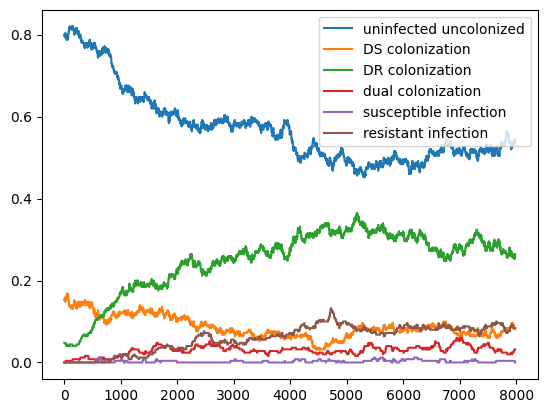

In [26]:
# Use the sum_and_relabel tool on point in the history
new_y = []
for y in result.y_history.T:
    new_y.append(sum_and_relabel(reduced_model, y))

# Make a dataframe of the results
# A Pandas DataFrame is designed to match R dataframes, so hopefully it will be somewhat familiar 
df = pd.DataFrame(new_y)

(df / initial_pop).plot()

In [27]:
pathway_dict = {}
for k,v in result.pathway_counter.items():
    try:
        label = reduced_model.all_reactions[int(k)].description
    except OverflowError:
        continue
    if label is not None:
        pathway_dict[label] = v

In [38]:
pathway_dict = {}
pretty_pathway_dict = {}

for k,v in result.pathway_counter.items():
    if int(k) < 0:
        continue
    reaction = reduced_model.all_reactions[int(k)]
    reactant_strs = [s.name if not isinstance(s, tuple) else (s[0].name, s[1]) for s in reaction.reactants]
    product_strs = [s.name if not isinstance(s, tuple) else (s[0].name, s[1]) for s in reaction.products]

    description = f"{reactant_strs} => {product_strs} {reaction.description}"
    current = pathway_dict.get(reaction, 0)
    pathway_dict[reaction] = current + v

    current = pretty_pathway_dict.get(reaction, 0)
    pretty_pathway_dict[description] = current + v

In [41]:
paths = sorted(pathway_dict.items(), key=lambda x: x[1], reverse=True)
pretty_paths = sorted(pretty_pathway_dict.items(), key=lambda x: x[1], reverse=True)
pretty_paths[:10]

[("['<M_M_M>'] => [] discharge", 922),
 ("['<M_M_M>'] => ['<X_M_M>'] treatment - doesn't hit niche - low efficacy",
  484),
 ("['<X_DR_DR>'] => ['<M_DR_DR>'] background repopulation with commensals",
  442),
 ("['<M_M_M>'] => ['<X_X_X>'] treatment - hits niche - moderate efficacy",
  402),
 ("['<M_DR_DR>'] => [] discharge", 392),
 ("['<X_M_M>'] => ['<M_M_M>'] background repopulation with commensals", 378),
 ("['<X_X_X>'] => ['<M_X_X>'] background repopulation with commensals", 309),
 ("['<M_DR_DR>'] => ['<X_DR_DR>'] treatment - doesn't hit niche - low efficacy",
  207),
 ("['<M_DR_DR>'] => ['<X_DR_DR>'] treatment - hits niche - moderate efficacy",
  194),
 ("['<M_DS_DS>'] => [] discharge", 162)]

In [51]:
from functools import reduce
def net_colonization_increase(reaction, dr=True):
    find_str = '_DR' if dr else '_DS'

    def count_s(s, find_str):
        if isinstance(s, tuple):
            return s[1] * s[0].name.count(find_str)
        else:
            return s.name.count(find_str)
    right_count = reduce(lambda x,s: x+count_s(s,find_str), reaction.reactants, 0)
    left_count = reduce(lambda x,s: x+count_s(s,find_str), reaction.products, 0)
    
    return left_count > right_count

dr_increases = {}

for reaction,n in paths:
    if net_colonization_increase(reaction, dr=True):
        dr_increases[reaction.description] = dr_increases.get(reaction.description, 0) + n

In [52]:
dr_increases

{'N2 displaces N1': 344,
 'N1 displaces N2': 301,
 'transmission from main to N2 (without high carriage conversion)': 158,
 'transmission from main to N1 (without high carriage conversion)': 141,
 'transmission from N2 to N1 (without high carriage conversion)': 149,
 'transmission from N1 to N2 (without high carriage conversion)': 149,
 'transmission from N1 to N1 (without high carriage conversion)': 139,
 'transmission from N2 to N2 (without high carriage conversion)': 129,
 'treatment - hits niche - moderate efficacy - DE NOVO': 8,
 'transmission from N1 to N1 (WITH high carriage conversion)': 1,
 'transmission from main to N2 (WITH high carriage conversion)': 1}